## BrainTriage Data Visualisation and Exploration

In [126]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils import data
import os
import SimpleITK as sitk
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import math as math
import csv
import pandas as pd
from tqdm.notebook import tqdm
import pdb
from torchvision import models


## reload scripts before executing them
%load_ext autoreload
%autoreload 2

from visualisation.slice_plotter import plot_slices
from visualisation.slice_plotter import plot_slices_by_acquisition
print(os.listdir())

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
['EDA.ipynb', '.DS_Store', 'test-resnet.py', 'dataset', 'models', 'utils.py', 'examples', 'train', 'differences.png', 'visualisation', '.ipynb_checkpoints', 'test-combinednet.py']


In [127]:
in_dir = '../data/BrainTriage/train/full'
out_dir = '../data/train'


In [128]:
DATA_DIR = out_dir

In [129]:
label_df = pd.read_csv(os.path.join(DATA_DIR,"labels_slices.csv"), names = ["patient_nr", "slice_nr", "class"])
label_df["class"] = label_df["class"].astype("int8")
patient_list = np.unique(label_df["patient_nr"])
print(label_df.head(), f"Dataframe shape: {label_df.shape}", sep="\n")
print(f"\nNumber of unique patient numbers: {len(np.unique(label_df['patient_nr']))}")
print(f"Number of unique slice numbers:   {len(np.unique(label_df['slice_nr']))}")
print(f"Number of unique class values:    {len(np.unique(label_df['class']))}")

   patient_nr  slice_nr  class
0         797         0      1
1         797         1      1
2         797         2      1
3         797         3      1
4         797         4      1
Dataframe shape: (32000, 3)

Number of unique patient numbers: 1000
Number of unique slice numbers:   32
Number of unique class values:    2


## Interesting 

Things to consider.
TE = echo time
TR = repetition time



![image](differences.png)


T1, T2, and T2-Flair show  some characterics in an opposing way. White matter is light in T1 and dark gray in T2 and T2 Flair


This means that we can differentiate between CSF, WhiteMatter, Gray Matter Fat and Inflammations. 
I think it will be interesting to look at visualizations of slices of a patient with vs without abnormalities.

## TODO CHIHAB 

Intensities normaliseren...

PLOT CIRKELS OM GEBIEDEN MET HOOGSTE/LAAGSTE intensiteit

In [130]:
klass = "abnormal"
patient = "251"
t1_path = os.path.join(in_dir, klass, patient,'T1.mha')
t2_path = os.path.join(in_dir, klass, patient,'T2.mha')
t2_flair_path = os.path.join(in_dir, klass, patient,'T2-FLAIR.mha')

## Load all images as numpy arrays
t1_array = sitk.GetArrayFromImage(sitk.ReadImage(t1_path))
t2_array = sitk.GetArrayFromImage(sitk.ReadImage(t2_path))
t2_flair_array = sitk.GetArrayFromImage(sitk.ReadImage(t2_flair_path))


In [131]:
slice_number = 4
t1_slice = t1_array[slice_number,:,:]
t2_slice = t2_array[slice_number,:,:]
t2_flair_slice = t2_flair_array[slice_number,:,:]
comb_data = np.array([t1_slice, t2_slice, t2_flair_slice])


In [132]:
# logarithmic transformation
def log_transform(x):
    """Apply a logarithmic transformation
    """
    return np.log(x, where = x!=0)
    # SUBSTITUTE None ABOVE OR PLACE YOUR CODE HERE

In [133]:
# intensity inversion
def intensity_inversion(x):
    """Apply an intensity inversion
    """
    return 256 - 1 -x
    # SUBSTITUTE None ABOVE OR PLACE YOUR CODE HERE

In [134]:
experiment1 = log_transform(t2_flair_slice)

In [135]:
zz = t2_flair_slice / t2_flair_slice.max()
zz = zz * 255

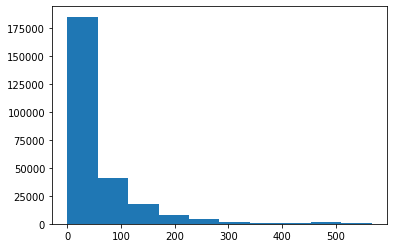

In [136]:
plt.hist(t2_flair_slice.flatten())
plt.show()

In [137]:
# comb_data[1][0,:]
t2_flair_slice.max()
# np.mean(t2_flair_slice)

567

In [138]:
t1_slice.min()
np.mean(t1_slice)

135.9106101989746

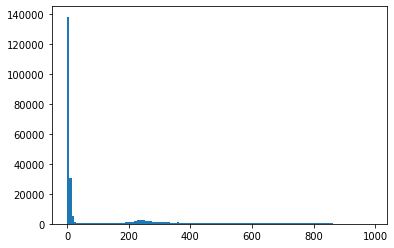

In [139]:
plt.hist(t1_slice.flatten().T, bins='auto')
plt.show()

In [175]:
import numpy as np
from torchvision import transforms
from PIL import Image


def preprocess(X):
    
    '''
    X = torch.load(...)'s output (hence, a Torch Tensor)
    '''
    # Define transformations:
    
    preprocessing = transforms.Compose([
        transforms.CenterCrop(425),
        transforms.ToTensor()
    ])
    # Transform Torch Tensor to NP Array
    X_array = X.numpy()
    
    # Scale Data
    X_img = (X_array / np.max(X_array) * 255)
    print(f"Unique vals: {len(np.unique(X_img))}", f"Min: {X_img.min()}", f"Max: {X_img.max()}", sep="\n")
    
    pil_img = Image.fromarray(X_img)
    
    return preprocessing(pil_img)

def preprocess_to_int8(X):
    
    '''
    X = torch.load(...)'s output (hence, a Torch Tensor)
    '''
    # Define transformations:
    
    preprocessing = transforms.Compose([
        transforms.CenterCrop(425),
        transforms.ToTensor()
    ])
    # Transform Torch Tensor to NP Array
    X_array = X.numpy()
    
    # Scale Data
    X_img = (X_array / np.max(X_array) * 255).astype(np.uint8)
    print(f"Unique vals: {len(np.unique(X_img))}", f"Min: {X_img.min()}", f"Max: {X_img.max()}", sep="\n")
    
    pil_img = Image.fromarray(X_img)
    
    return preprocessing(pil_img)

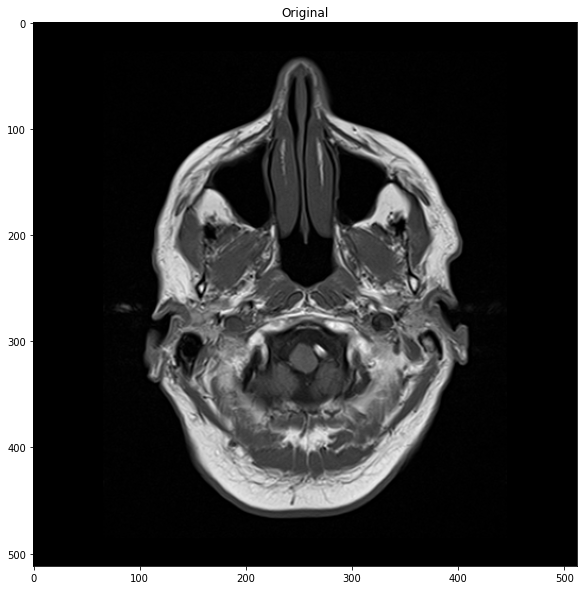

Without int conversion
Unique vals: 952
Min: 0.0
Max: 255.0
torch.Size([425, 425])
tensor(0.) tensor(255.) 952 torch.float32

With int conversion
Unique vals: 254
Min: 0
Max: 255
torch.Size([425, 425]) tensor(1.)


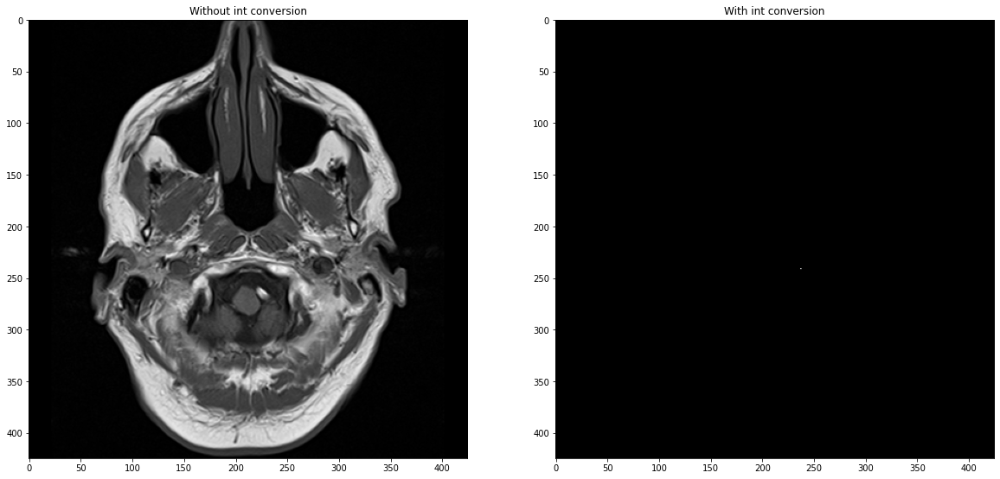

In [184]:
# from dataset.preprocessing import preprocess

plt.figure(figsize=(10,10))
plt.imshow(t1_slice, cmap="gray")
plt.title("Original")
plt.show()

plt.figure(figsize=(20,20))
print("Without int conversion")
ax2 = plt.subplot(1,2,1)
t1_slice_copy = t1_slice.astype("int16").copy()
processed_t1_slice = np.squeeze(preprocess(torch.Tensor(t1_slice_copy)))
print(processed_t1_slice.shape)
print(processed_t1_slice.min(), processed_t1_slice.max(), len(np.unique(processed_t1_slice)), processed_t1_slice.dtype)
ax2.set_title("Without int conversion")
ax2.imshow(processed_t1_slice.numpy(), cmap="gray")

print("\nWith int conversion")
ax3 = plt.subplot(1,2,2)
t1_slice_copy = t1_slice.astype("int16").copy()
processed_t1_slice = np.squeeze(preprocess_to_int8(torch.Tensor(t1_slice_copy)))
print(processed_t1_slice.shape, processed_t1_slice.max())
ax3.set_title("With int conversion")
ax3.imshow(processed_t1_slice.numpy(), cmap="gray")

plt.show()

In [181]:
processed_t1_slice

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])

In [104]:
print(t1_slice.shape, t1_slice.min(), t1_slice.max())

(512, 512) 0 988


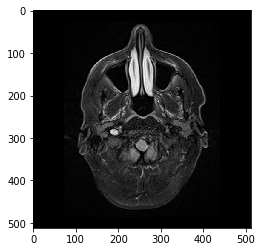

In [71]:
plt.imshow(t2_flair_slice, cmap="gray")

In [14]:
zz = t2_flair_slice / t2_flair_slice.max()

In [15]:
zz[103,239]

0.855379188712522

/home/chb3k/Documents/KI/master/ISMI/final_project/ISMI-braintriage/code/visualisation/slice_plotter.py:69: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axs = plt.subplots(1,3, figsize=(18,12))


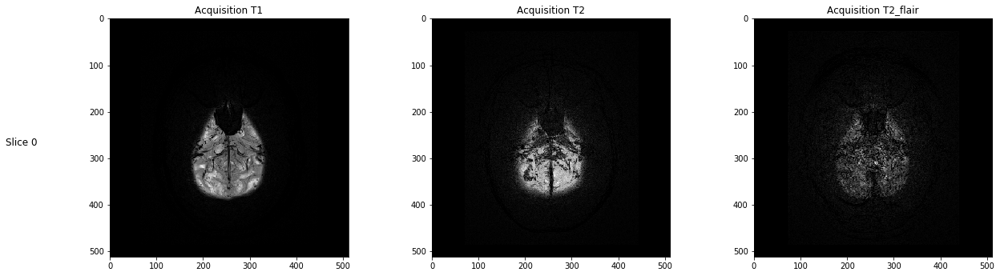

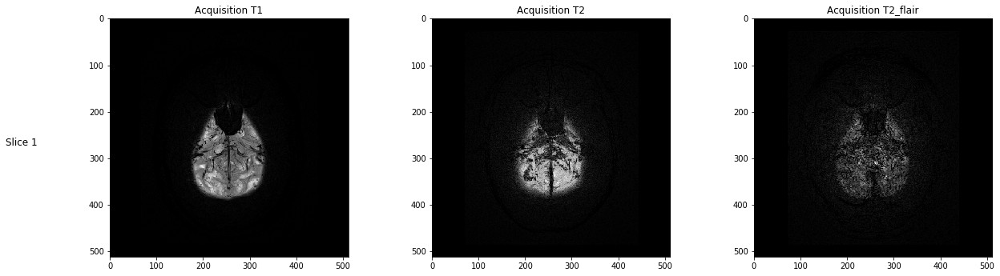

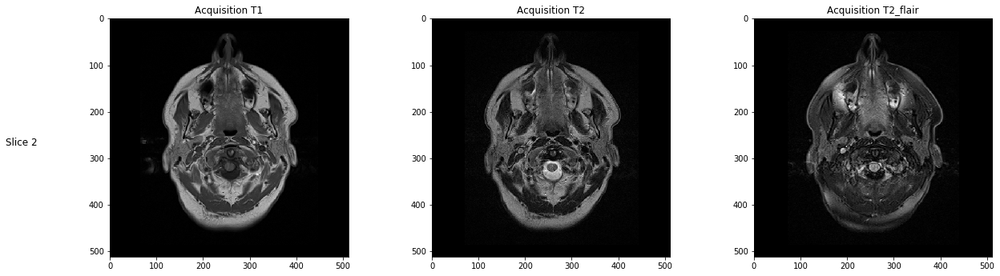

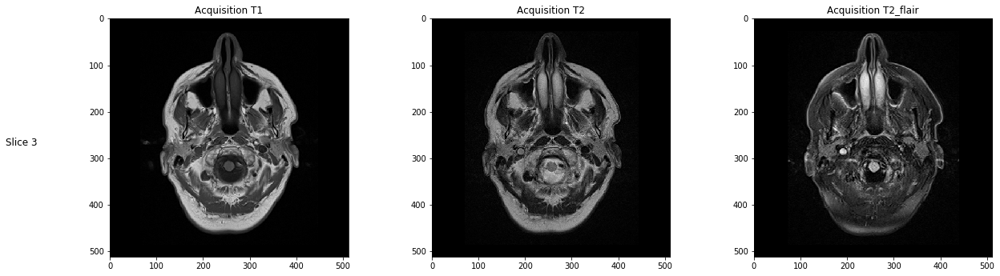

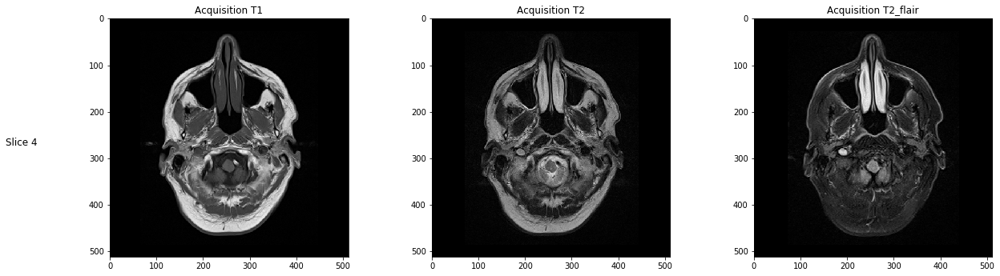

...

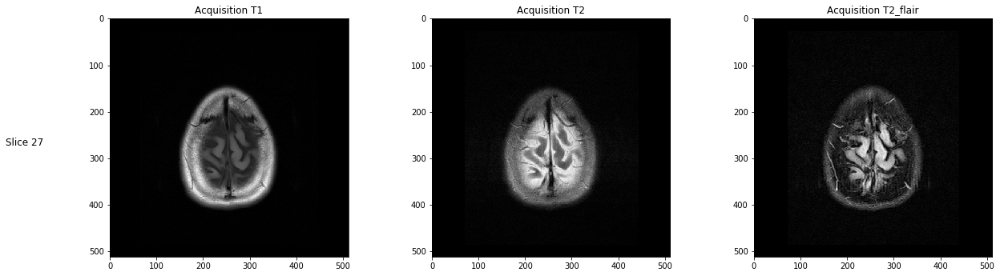

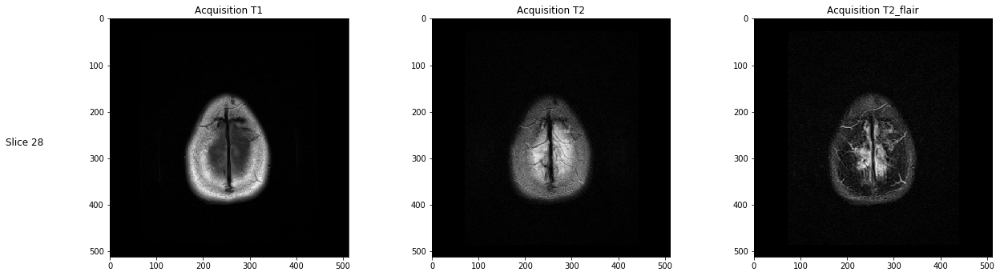

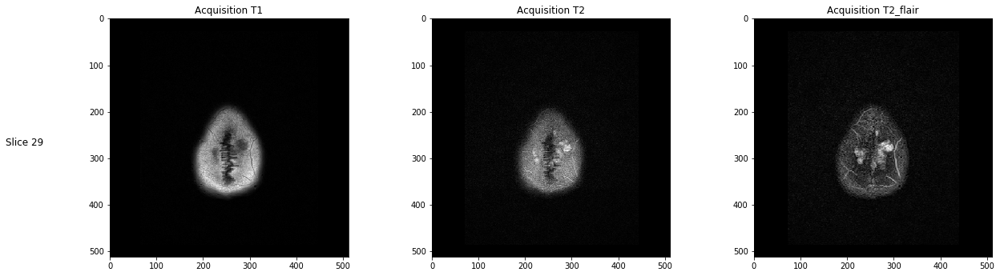

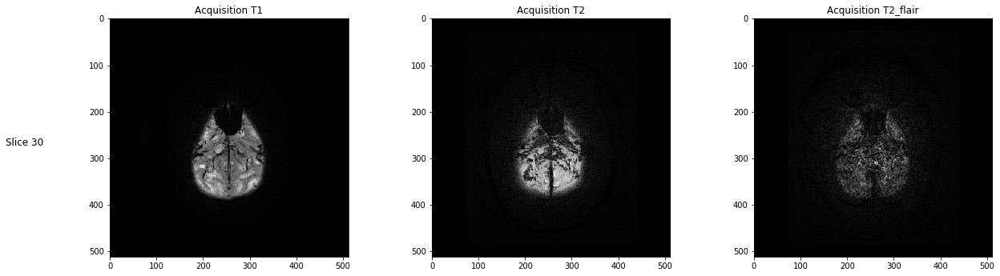

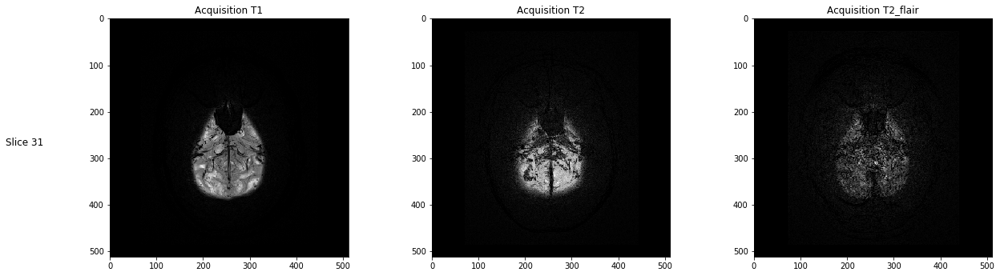

In [36]:
plot_slices_by_acquisition(251,(0,31),DATA_DIR)

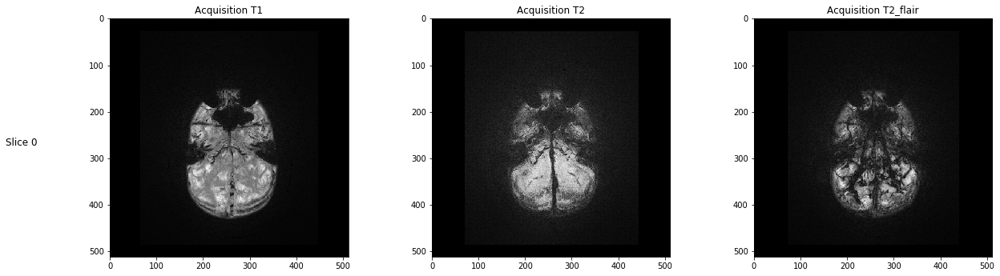

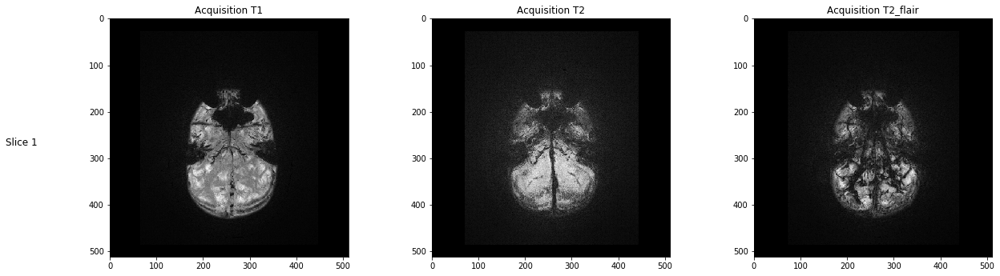

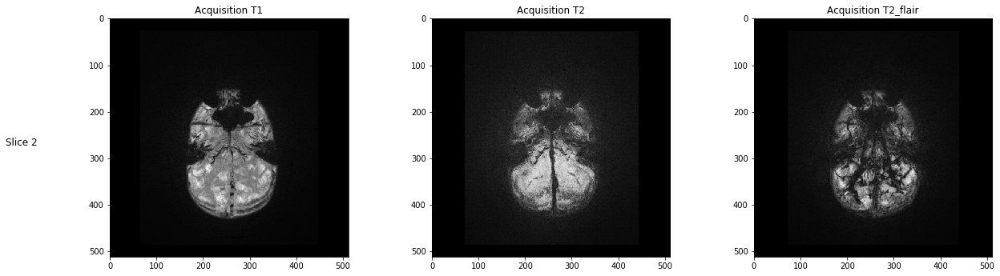

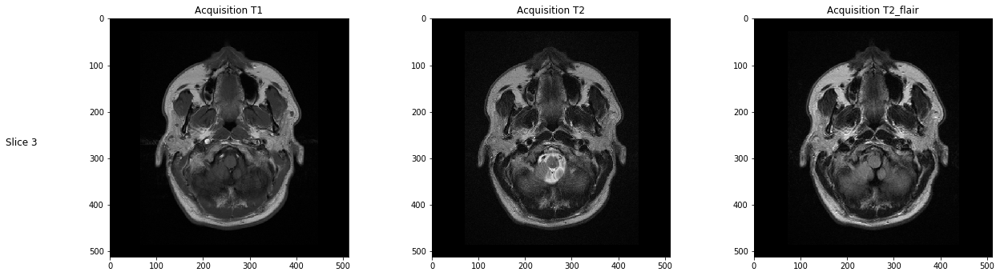

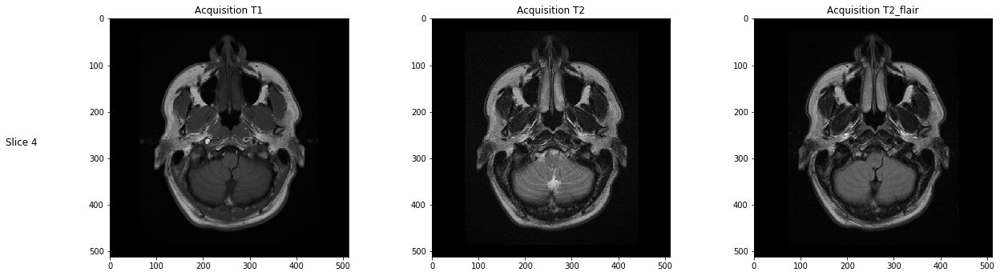

...

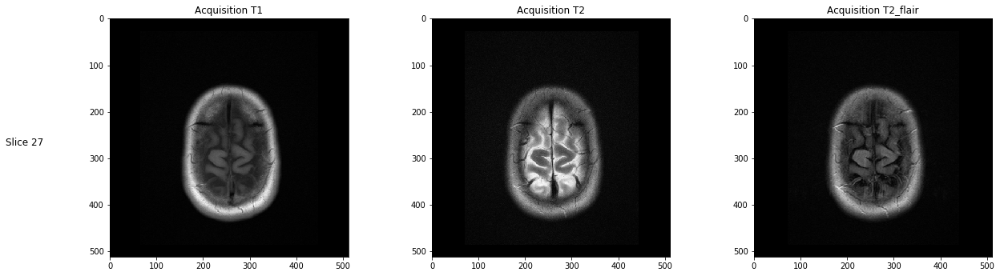

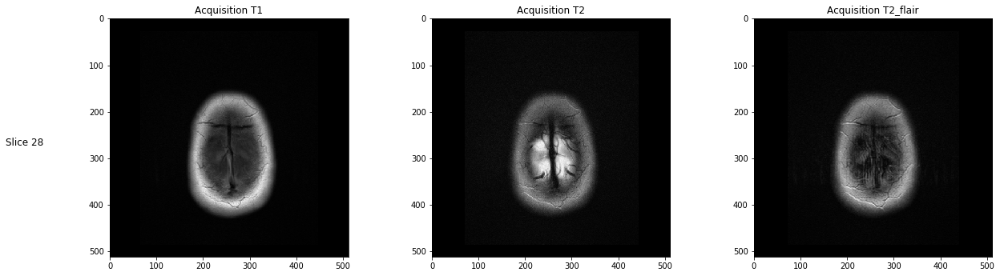

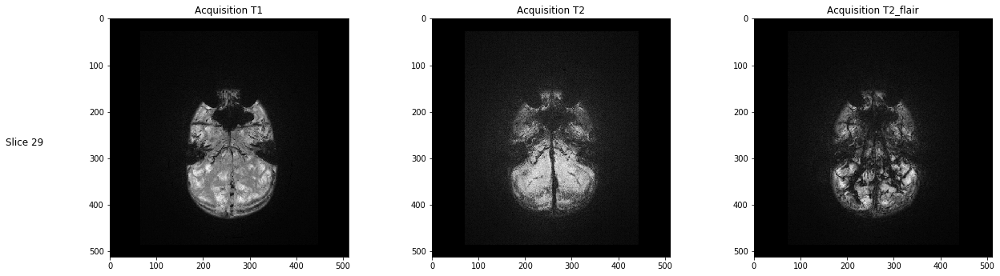

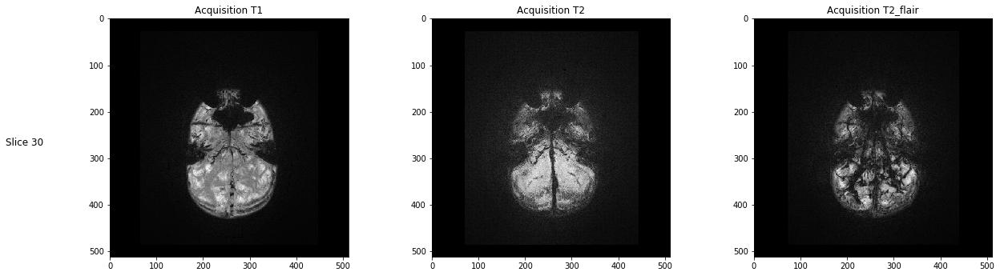

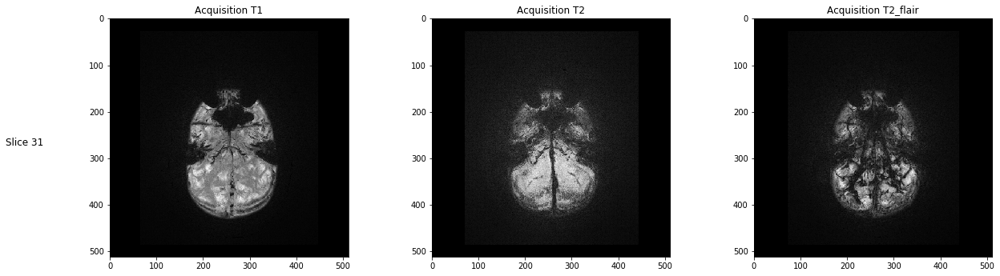

In [37]:
plot_slices_by_acquisition(18,(0,31),DATA_DIR)

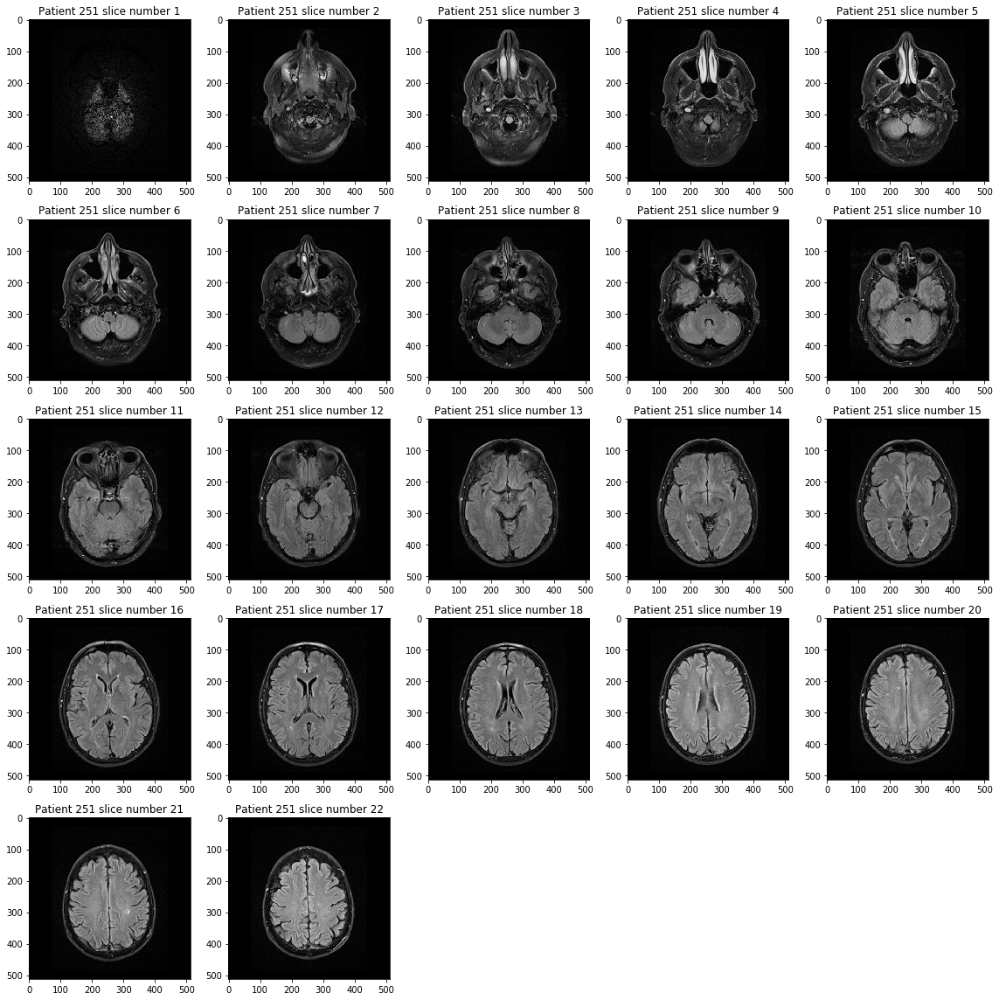

In [336]:
plot_slices(251, (1,22), DATA_DIR,5)